# Visión por Computador - Práctica 1 - Filtrado de Imágenes

#### 12 puntos   |   Fecha de entrega: 03 de Noviembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>PEDRO LUIS ABRIL ORTEGA</mark>



---

## Normas de entrega

1. Para este trabajo, al igual que para los demás, se debe presentar código, resultados, discusión de los mismos, y presentación y análisis del trabajo realizado, todo integrado en el propio Google Colab Notebook (es decir, no se entrega ninguna memoria separada en `.pdf` ni ningún código `.py`). Se recuerda que código y resultados sin informe explicativo no puntúa.

2. En relación con el punto anterior, solo se acepta la entrega de ficheros `.ipynb` (no resulta válido entregar un fichero `.py`).

3. El diseño de celdas del documento debe ser respetado.

4. Solo se entregará el fichero `.ipynb` (incorporando código, resultados, y explicación del trabajo realizado y los resultados obtenidos) y no se enviarán las imágenes empleadas.

5. El path para la lectura de imágenes, o cualquier otro fichero de entrada, debe ser siempre “/content/drive/My Drive/images/nombre_fichero”

6. El código deberá  presentarse adecudamente comentado y con los resultados obtenidos en cada apartado, junto con la presentación del trabajo realizado y la discusión y análisis de los resultados obtenidos. Es importante reiterar que la entrega de código sin informe explicativo o valoraciones no puntúa. Por otro lado, el código debe ir comentado en comentarios en celdas de código, mientras que el análisis y discusión, tanto del trabajo realizado como de los resultados obtenidos, debe ir en celdas de texto.

Este trabajo de implementación tiene como objetivo principal **familiarizarse con la implementación y uso de filtros de convolución, así como del cálculo de las derivadas de una imagen y sus posibles aplicaciones**.








---



## Funciones de apoyo y conexión con Google Drive

In [ ]:
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# We import the modules to use
import os,sys
import cv2, numpy as np, math
from matplotlib import pyplot as plt
# change directory
%cd '/content/drive/My Drive'
#  the current directory
%pwd

# This allows to display images  and to save  them in cells
%matplotlib inline
# this definition allows to read files in a specific path
get_image = lambda route: os.path.join('/content/drive/My Drive/images', route)

/content/drive/My Drive


Las funciones que se incluyen a continuación, se proporcionan como ayuda/apoyo para el estudiante. **En caso de que el alumnado prefiera utilizar otras funciones para lectura, normalización y visualización de imágenes, tiene total libertad para hacerlo, pero sí debe justificar y explicar razonadamente el motivo de dicho cambio y describir las modificaciones realizadas.**

Recuérdese que todas las imágenes a emplear durante las prácticas de todo el curso se pueden encontrar en el enlace de Google Drive indicado en PRADO: https://pradogrado2425.ugr.es/mod/url/view.php?id=91457 En concreto, https://drive.google.com/drive/folders/1UtvY8q6w1Cz9a9T9zxIqSweoRLgNwoW-

In [ ]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)



In [ ]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [ ]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()



In [ ]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

IMPORTANT NOTE: it is important to notice that this function stacks all images
and later call displayIm(). This implies that the normalization (rangeDisplay01()) is done
at the very end of the process. As a consequence, if the stacked images have different
range values they can be displayed in a "weird" way (with black regions (pixel value = 0)
looking grey). In case the visualization seems to be a problem, a possible solution
would be to create vim using vim.append(rangeDisplay01(...)). In this way, all images
would be on the same range of values (negative values around 0 (black),
0 values around 0.5 (grey), and positive values closer to 1 (white))

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)


# **Ejercicio 1: discretización de máscaras y filtrado Gaussiano** (6 puntos)

En este ejercicio aprenderemos a discretizar máscaras de convolución y a aplicarlas sobre imágenes empleando funciones de OpenCV. También buscamos hacerlo de un modo eficiente, y es por ello que, en toda la práctica, se exige el uso de convoluciones 1D (separables).





## A) (1.5 puntos)

En este apartado se deben realizar las siguientes tareas:

1. Calcular las máscaras discretas 1D de la Gaussiana, así como su primera y segunda derivadas (normalizadas), considerando que la entrada a dicha función de creación de máscaras 1D puede ser tanto un posible sigma como un posible tamaño de máscara.
2. Emplear los siguientes valores de sigma ($\{1, 1.5, 2.5, 6\}$) y los siguientes valores de tamaño de máscara ($\{7, 11, 15\}$), y mostrar el perfil (es decir, la silueta de las máscaras como funciones 1D) para verificar que las máscaras creadas son correctas.
3. Describir/explicar/analizar si las formas de dichos kernels tienen sentido y se corresponden con lo que esperaríamos ver.

En este ejercicio lo que he hecho ha sido rellenar su función con su operación correspondiente. También he quitado la constante de normalización ya que luego normalizo.

In [ ]:
def GaussFunc(x,sigma):
    return np.exp(-x**2 / (2 * sigma**2))

def GaussDeriv1Func(x,sigma):
    return sigma * -x * GaussFunc(x, sigma) / sigma**2

def GaussDeriv2Func(x,sigma):
    return (sigma**2) * (x**2 - sigma**2) * GaussFunc(x, sigma) / sigma**4

def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    # order = 0 -> función Gaussiana
    # order = 1 -> derivada de la Gaussiana
    # order = 2 -> derivada segunda de la Gaussiana

    # Calcular el tamaño de la máscara si no se proporciona
    if sigma > 0 and sizeMask <= 0:
        sizeMask = int(2 * (3 * sigma) + 1)  # Asegurarse de que sea un entero
        if(sizeMask % 2 == 0):
          sizeMask = sizeMask - 1
    elif sizeMask > 0 and sigma <= 0:
        sigma = (sizeMask - 1) / (3 * 2)

    if sizeMask % 2 == 0:
        raise ValueError("El tamaño de la máscara debe ser impar.")

    halfSize = sizeMask // 2
    x = np.arange(-halfSize, halfSize + 1)

    # Crear la máscara dependiendo del orden
    if order == 0:
        mask = GaussFunc(x, sigma)
        mask = mask / np.abs(np.sum(mask))
    elif order == 1:
        mask = GaussDeriv1Func(x, sigma)
    elif order == 2:
        mask = GaussDeriv2Func(x, sigma)
    else:
        raise ValueError("El orden debe ser 0 (Gaussiana), 1 (primera derivada), o 2 (segunda derivada).")


    return mask

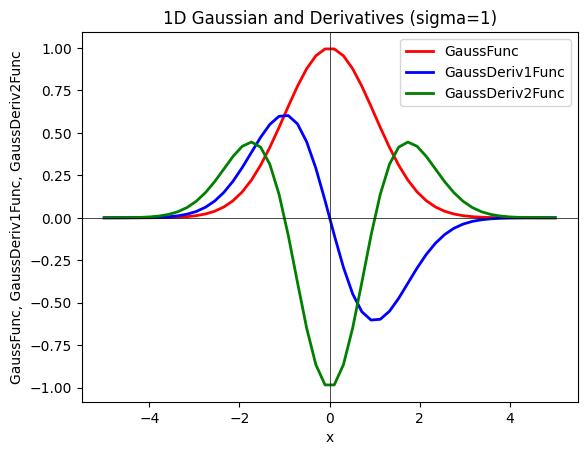

In [ ]:
# Con la siguiente figura verificamos que las funciones Gaussianas implementadas son correctas
plt.figure()
xvalues = np.linspace(-5, 5)
yvalues1 = GaussFunc(xvalues,1)
yvalues2 = GaussDeriv1Func(xvalues,1)
yvalues3 = GaussDeriv2Func(xvalues,1)
plt.plot(xvalues, yvalues1, lw=2, color='red',
label='GaussFunc')
plt.plot(xvalues, yvalues2, lw=2, color='blue',
label='GaussDeriv1Func')
plt.plot(xvalues, yvalues3, lw=2, color='green',
label='GaussDeriv2Func')
plt.title('1D Gaussian and Derivatives (sigma=1)')
plt.xlabel('x')
plt.ylabel('GaussFunc, GaussDeriv1Func, GaussDeriv2Func')
plt.axhline(0, lw=0.5, color='black')
plt.axvline(0, lw=0.5, color='black')
plt.legend();

####Justificación de resultados

Viendo los resultados podemos observar que la forma de la guassiana es correcta, ya que tiene forma de campana, propia de la función gaussiana.

En cuanto a la primera derivada, debe salir una gráfica que cruce el eje x, donde pase de una curva creciente a decreciente. Esto indica la pendiente de la gaussiana.

Respecto a la segunda derivada, debe presentar una gráfica con 2 picos positivos y un pico negativo en el centro. Estos picos indican la concavidad de la función gaussiana.


Por tanto, teniendo esto claro, podemos verificar que los resultados son correctos.



FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA


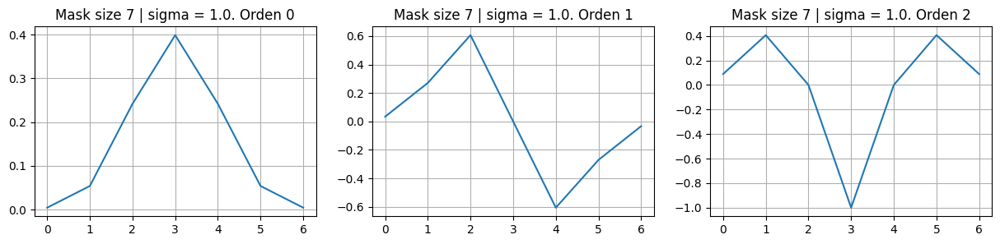

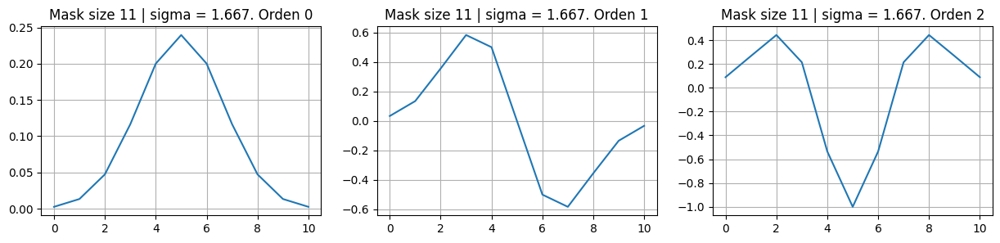

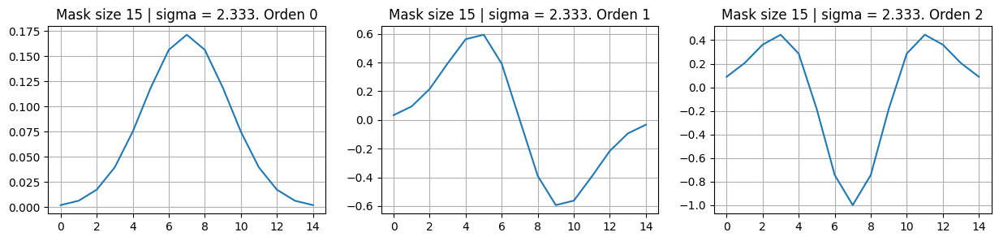

FIJAMOS AHORA EL SIGMA


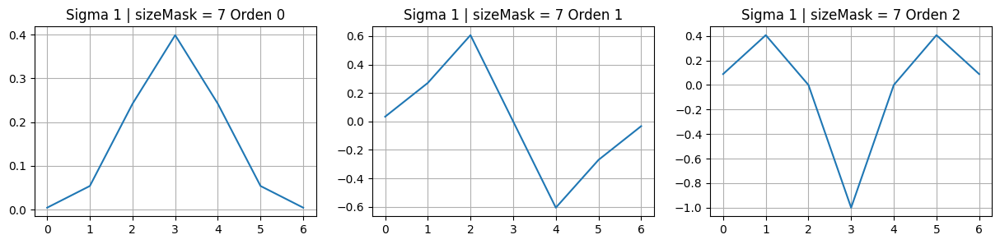

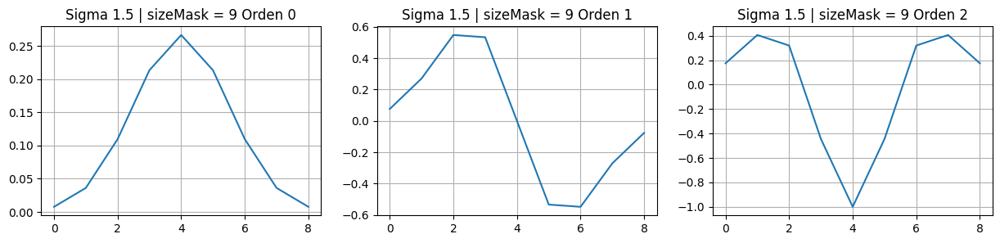

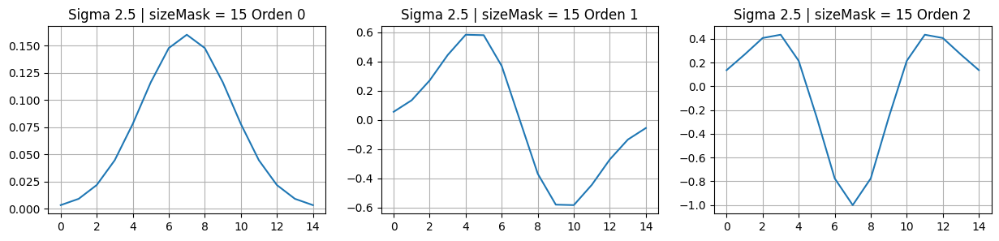

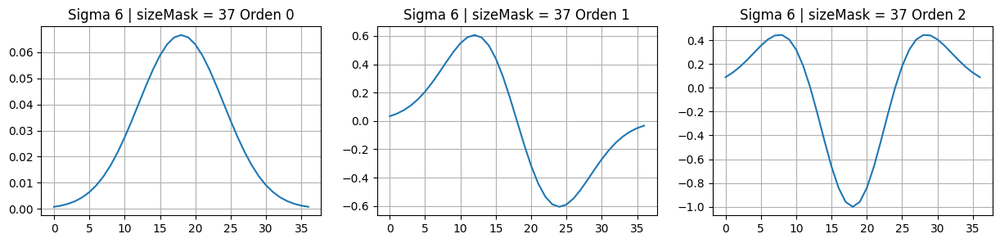

In [ ]:
sigma_values = [1, 1.5, 2.5, 6]
size_masks = [7, 11, 15]

plt.rcParams["figure.figsize"] = (15,3) # para ajustar tamaño del ancho y alto (ejes)
print('FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA')
for sizeMask in size_masks:
  for i in range(0,3):
    #A CUBRIR POR EL ALUMNADO
    mask = gaussianMask1D(sigma=-1, sizeMask=sizeMask, order=i)  # Usamos un sigma arbitrario
    plt.subplot(1, 3, i + 1)
    plt.plot(mask);
    plt.title(f'Mask size {sizeMask} | sigma = {round((sizeMask - 1) / 6, 3)}. Orden {i}')
    plt.grid(True)
    #plt.legend()
  plt.show()

print('FIJAMOS AHORA EL SIGMA')
for sigma in sigma_values:
  for i in range(0,3):
   #A CUBRIR POR EL ALUMNADO
      mask = gaussianMask1D(sigma=sigma, sizeMask=0, order=i)  # Usamos un tamaño de máscara fijo
      plt.subplot(1, 3, i + 1)
      plt.plot(mask)
      plt.title(f'Sigma {sigma} | sizeMask = {mask.size} Orden {i}')
      plt.grid(True)
      #plt.legend()

  plt.show()

## B) (1.5 puntos)

En este apartado se debe leer una imagen en escala de grises (`'zebra.jpg'`) y esta debe ser filtrada mostrando el resultado de la convolución con una Gaussiana, con la primera derivada de la Gaussiana (tanto en $X$ como en $Y$), y con la segunda derivada de la Gaussiana (tanto en $X$ como en $Y$). Para ello, hay que:
1. emplear los siguientes sigmas ($\{0.75,1,2,4,8, 16\}$),
2. usar la función de OpenCV `sepFilter2D()` con las máscaras calculadas a partir de las funciones desarrolladas en el apartado anterior,
3. mostrar todas las imágenes dentro del mismo canvas, tal y como se muestra más abajo,
4. analizar los resultados obtenidos y discutir si se corresponden con lo se esperaría obtener en base a nuestro conocimiento de la teoría.




####Justificación de resultados

Para mi función my2DConv lo primero que he hecho ha sido calcular las máscaras gaussianas, y dependiendo del orden que se pase como parámetro se elegirá hacer una máscara gaussiana, primera derivada o segunda derivada.

Con estas 2 máscaras 1D se las paso a la función sepFilter2D para que aplique el filtro correspondiente a las máscaras pasadas.


Respecto a los resultados, debería de salir:

Suavizado gaussiano: La imagen debe aparecer suavizada, y a medida que aumenta el sigma se van perdiendo detalles.

Primera derivada: Debe resaltar los bordes, mostrando transiciones bruscas de intensidad. En x, deberían resaltarse más los detalles que se encuentran en vertical, en cuanto a y, deberían resaltarse más los detalles horizontales.

Segunda derivada: Debe resaltar áreas de cambio en la curvatura, mostrando los bordes más definidos. En x, se resaltan más los detalles que se encuentran en vertical, y en y, se resaltan más los detalles horizontales.



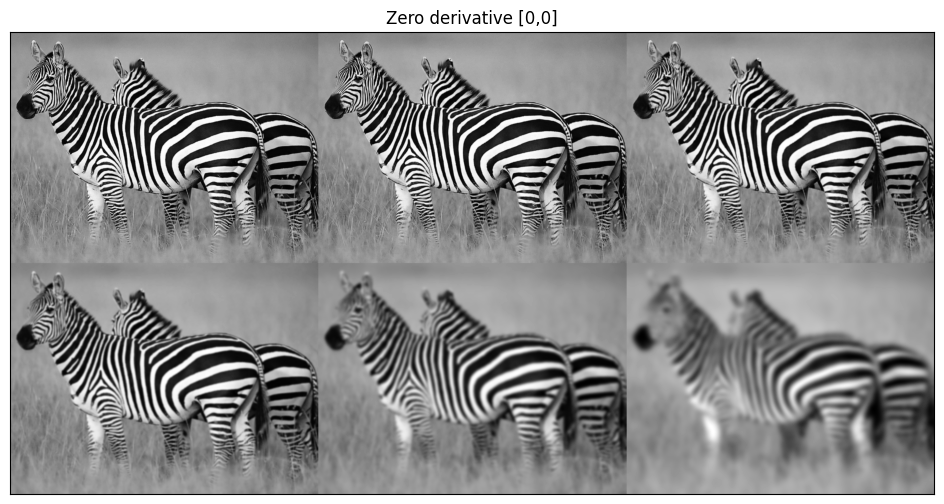

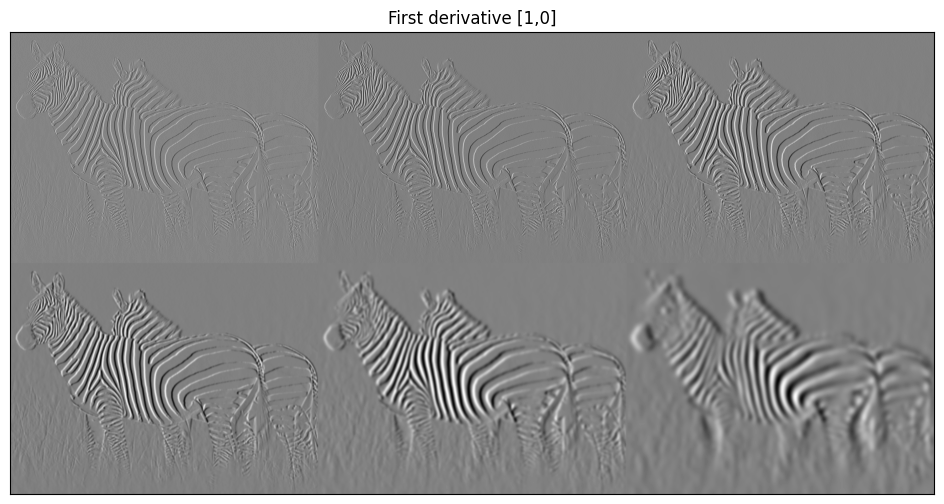

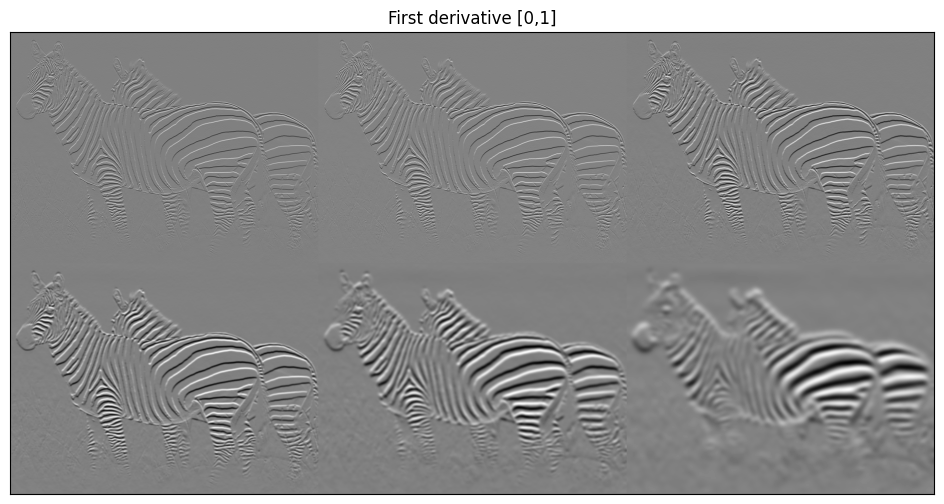

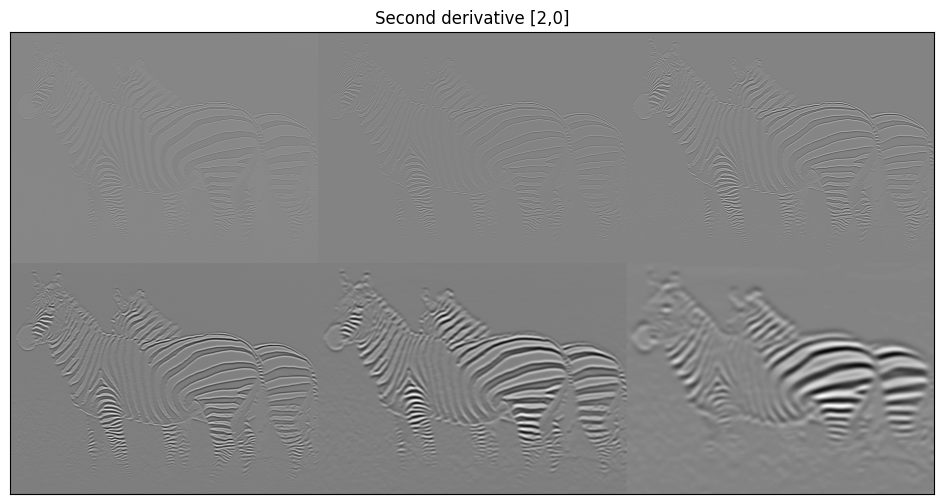

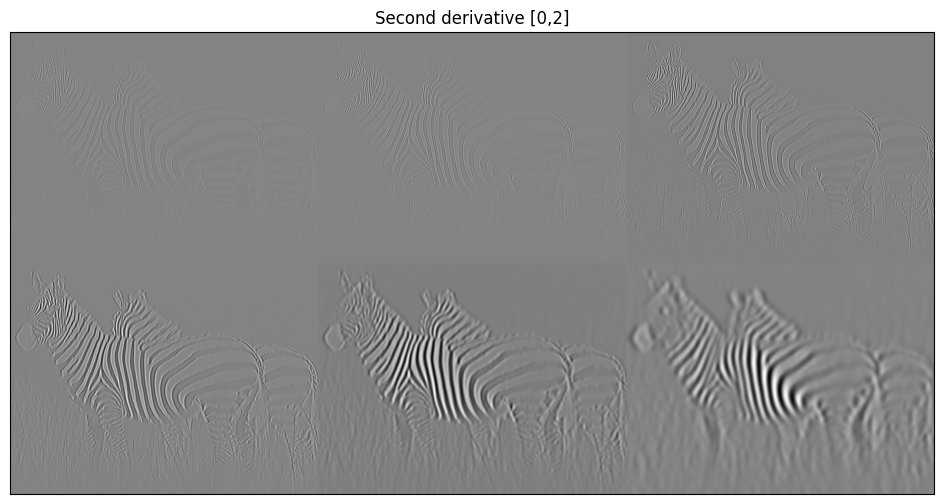

In [ ]:
def my2DConv(im, sigma, orders):
  # Calculamos las máscaras separables 1D de Gaussiana y sus derivadas
  mask_x = gaussianMask1D(sigma=sigma, sizeMask=int(6 * sigma + 1), order=orders[0])
  mask_y = gaussianMask1D(sigma=sigma, sizeMask=int(6 * sigma + 1), order=orders[1])
  if orders==[0,0]: # Suavizado Gaussiano
    return cv2.sepFilter2D(im,-1,mask_x,mask_y)
  elif orders==[1,0] or orders==[0,1]: # Derivada en X o en Y
    return cv2.sepFilter2D(im,-1,mask_x,mask_y)
  elif orders==[2,0] or orders==[0,2]: # Derivada segunda en X o en Y
    return cv2.sepFilter2D(im,-1,mask_y,mask_x)
  else:
    print('error in order of derivative')

sigmas = [0.75,1,2,4,8,16]


im=cv2.imread(get_image('zebra.jpg'),0).astype(np.float64)

#im = im.astype(np.float64)

vim0=[]
orders=[0,0]
for sigma in sigmas:
  vim0.append(rangeDisplay01(my2DConv(im,sigma,orders),True))

vim1=[]
orders=[1,0]
for sigma in sigmas:
  vim1.append(rangeDisplay01(my2DConv(im,sigma,orders),True))

vim2=[]
orders=[0,1]
for sigma in sigmas:
  vim2.append(rangeDisplay01(my2DConv(im,sigma,orders),True))

vim3=[]
orders=[2,0]
for sigma in sigmas:
  vim3.append(rangeDisplay01(my2DConv(im,sigma,orders),True))

vim4=[]
orders=[0,2]
for sigma in sigmas:
  vim4.append(rangeDisplay01(my2DConv(im,sigma,orders),True))

#A CUBRIR POR EL ALUMNADO
displayMI_ES(vim0,'Zero derivative [0,0]',2)
displayMI_ES(vim1,'First derivative [1,0]',2)
displayMI_ES(vim2,'First derivative [0,1]',2)
displayMI_ES(vim3,'Second derivative [2,0]',2)
displayMI_ES(vim4,'Second derivative [0,2]',2)

## C) (1 punto)

En este apartado hay que emplear la función de OpenCV `sepFilter2D()` con $\sigma=2.0$ para calcular y mostrar el gradiente (4 imágenes: derivada en $X$, derivada en $Y$, magnitud y orientación) y la Laplaciana de la Gaussiana. Se debe explicar el trabajo realizado, incluyendo las expresiones matemáticas subyacentes y el análisis, al igual que en todos los ejercicios, relativo a si los resultados obtenidos se corresponden con lo esperado.

####Justificación de resultados

Para calcular el gradiente, he reutilizado la función my2DConv del apartado anterior, ya que esta función aplica sepFilter2D utilizando dos máscaras, según el orden especificado.

En cuanto a la Laplaciana, se obtiene sumando los resultados de aplicar las máscaras en ambas direcciones. Para calcular la Laplaciana en la dirección X, se realiza la segunda derivada en X y se aplica una máscara gaussiana en Y. Por otro lado, para la Laplaciana en la dirección Y, se aplica la segunda derivada en Y y la máscara gaussiana en X.

Finalmente, al sumar ambas Laplacianas y multiplicar el resultado por
sigma^2 se obtiene la Laplaciana de la Gaussiana.

Para obtener la magnitud y orientación he usado las fórmulas apropiadas:

magnitude = np.sqrt(dx^2 + dy^2)

orientation = np.arctan2(dy, dx)

Los resultados de aplicar el gradiente en x debe verse como más detalle en el eje y, mientras que el gradiente en y debe verse como más detalle en el eje x.

La magnitud del gradiente indica la intensidad del cambio en la imagen. Las áreas donde hay bordes o cambios abruptos en la intensidad aparecerán con valores altos (más claros en la visualización), mientras que las áreas uniformes o suaves tendrán valores bajos (más oscuros).

La orientación del gradiente representa la dirección del cambio más significativo en la intensidad de la imagen.

La Laplaciana resalta los bordes y las transiciones en intensidad en la imagen. Las áreas donde hay cambios abruptos en la intensidad (bordes) se mostrarán como valores altos (blancos o claros), mientras que las áreas uniformes se verán como valores bajos (oscuros).

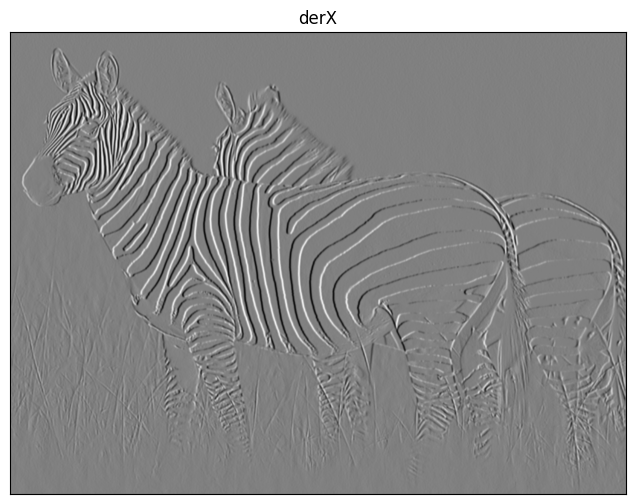

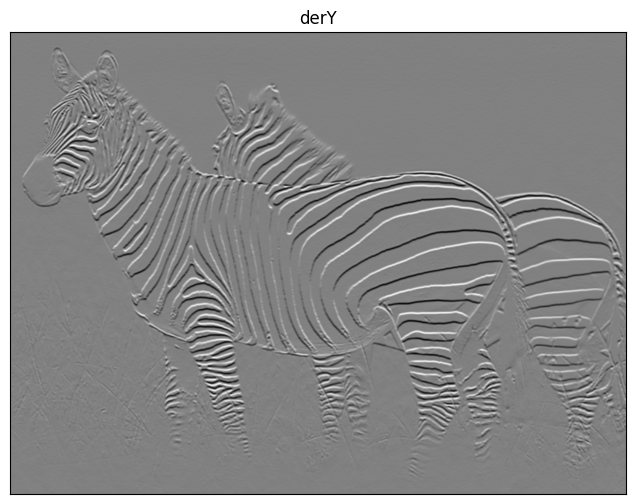

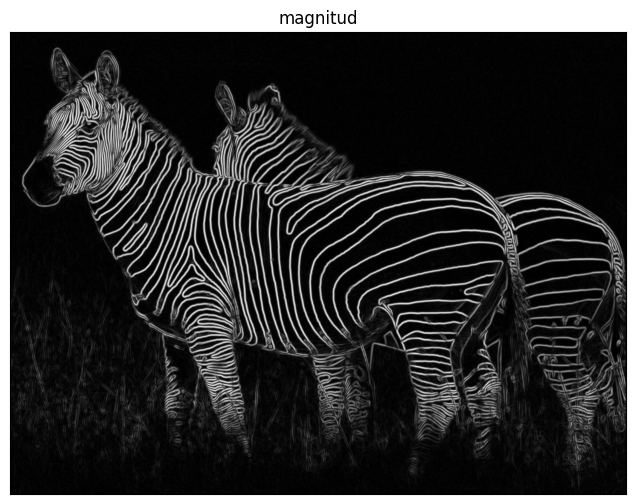

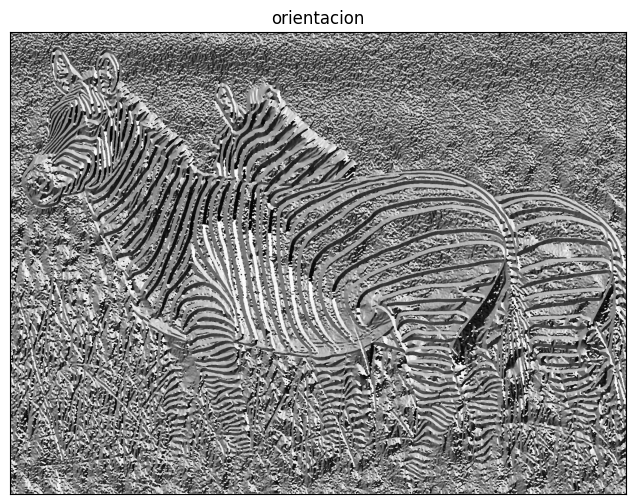

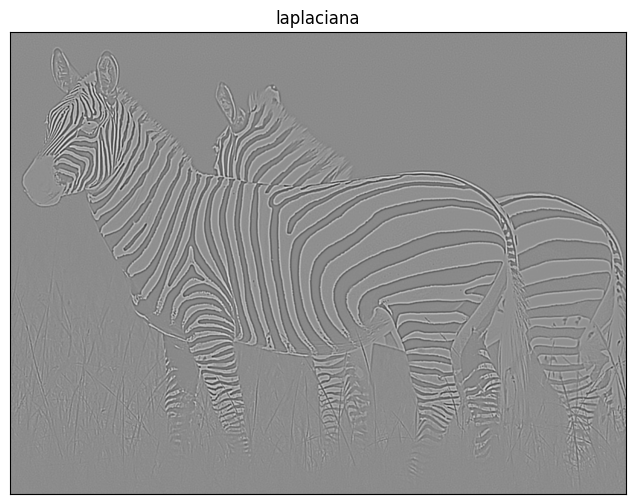

In [ ]:
def gradientIM(im,sigma):

  dx = my2DConv(im,sigma,[1,0])
  dy = my2DConv(im,sigma,[0,1])
  return dx,dy

def laplacianG(im,sigma):
  second_der = gaussianMask1D(sigma=sigma, sizeMask=int(6 * sigma + 1), order=2)  # Derivada segunda en x
  # Máscara de la Gaussiana en Y (G_y)
  gaussian_mask = gaussianMask1D(sigma=sigma, sizeMask=int(6 * sigma + 1), order=0)  # Gaussiana en y

  # Aplicar las máscaras separadamente en ambas direcciones
  laplacian_x = cv2.sepFilter2D(im, -1, second_der, gaussian_mask)  # Derivada segunda en x
  laplacian_y = cv2.sepFilter2D(im, -1, gaussian_mask, second_der)  # Derivada segunda en y

  # Sumar los resultados para obtener la Laplaciana de la Gaussiana
  laplacian = (sigma**2)*(laplacian_x + laplacian_y)
  return laplacian

#A CUBRIR POR EL ALUMNADO
# Aplicamos las funciones
sigma = 2
im = cv2.imread(get_image('zebra.jpg'), 0).astype(np.float64)  # Leer imagen en escala de grises

# Calcular gradiente
dx, dy = gradientIM(im, sigma)

# Calcular magnitud y orientación
magnitude = np.sqrt(dx**2 + dy**2)
orientation = np.arctan2(dy, dx)  # Obtener la orientación en radianes

# Calcular Laplaciana
laplacian = laplacianG(im, sigma)
laplacian_norm = rangeDisplay01(laplacian, True)

# Mostrar imágenes

displayIm(dx,'derX',2)
displayIm(dy,'derY',2)
displayIm(magnitude, 'magnitud', 2)
displayIm(orientation, 'orientacion', 2)

# Mostrar Laplaciana
displayIm(laplacian_norm, 'laplaciana', 2)


#displayMI_ES(vim0,'Zero derivative [0,0]',2)

## D) (1.5 puntos)

Implemente una función para realizar "a mano" la convolución separable (es decir, empleando kernels 1D). Dicha función debe recibir como entrada una imagen (con el _padding_ adecuado, en caso de que lo necesite, ya incorporado) y un kernel 1D, y debe proporcionar como salida la imagen convolucionada con el kernel en ambas direcciones.

Una vez haya implementado la función, realice el suavizado de la imagen `motorcycle.bmp` (usando un _Gaussian kernel size_ de 7, y dejando que sea la propia función de creación del kernel la que determine el $\sigma$ adecuado), y compare el resultado con el de `cv2.GaussianBlur` (en donde se debe optar por la misma estrategia: fijando $ksize=7$ y dejando que sea la propia función de OpenCV la que escoja el sigma). ¿Hay diferencias (sea a nivel de resultado final o de tiempo de ejecución)? En caso afirmativo, ¿a qué se pueden deber?

####Justificación de resultados

Para realizar la convolución 1D, he aplicado un padding a la imagen de entrada de forma horizontal, ya que la operación se aplica en esa dirección, recorriendo cada fila de la imagen. Esto permite que los bordes de la imagen estén correctamente procesados sin necesidad de bucles adicionales para manejar límites.

En el caso de la convolución 2D, primero aplico padding horizontal y luego padding vertical. Esto asegura que ambos ejes tengan suficiente margen para evitar problemas de borde al aplicar la convolución en ambas direcciones.

En cuanto a las diferencias entre mi implementación y la función GaussianBlur de OpenCV, hay algunas observaciones clave. A nivel de resultado, mi implementación produce una imagen ligeramente menos suavizada en comparación con GaussianBlur, lo cual podría deberse a variaciones en los parámetros del kernel o en la precisión de la implementación. Sin embargo, la diferencia visual es pequeña.

En términos de tiempo de ejecución, la diferencia es considerable. GaussianBlur está implementada en C++ y altamente optimizada, lo que le permite ejecutarse mucho más rápido que mi código en Python, que es interpretado y menos eficiente en comparación.

In [ ]:
def convolve1D(image, kernel):
    height, width = image.shape
    kernel_size = len(kernel)
    pad = kernel_size // 2

    # Padding en la dirección horizontal (solo columnas)
    padded_image = np.pad(image, ((0, 0), (pad, pad)), mode='constant', constant_values=0)

    output = np.zeros_like(image)  # Imagen de salida

    for y in range(height):
        for x in range(width):
            val = 0
            for i in range(kernel_size):
                val += kernel[i] * padded_image[y, x + pad - i]
            output[y, x] = val

    return output

def convolve2D(image, kernel_x, kernel_y):
    height, width = image.shape
    kernel_size_x = len(kernel_x)
    kernel_size_y = len(kernel_y)

    # Aplicamos convolución en la dirección horizontal (por filas)
    tmp = np.zeros_like(image)
    padded_image = np.pad(image, ((0, 0), (kernel_size_x // 2, kernel_size_x // 2)), mode='edge')  # Usar borde en lugar de constante

    for y in range(height):
        for x in range(width):
            val = 0
            for i in range(kernel_size_x):
                val += kernel_x[i] * padded_image[y, x + i - kernel_size_x // 2]
            tmp[y, x] = val

    # Ahora aplicamos la convolución en la dirección vertical (por columnas)
    output = np.zeros_like(image)
    padded_tmp = np.pad(tmp, ((kernel_size_y // 2, kernel_size_y // 2), (0, 0)), mode='edge')  # Usar borde en lugar de constante

    for y in range(height):
        for x in range(width):
            val = 0
            for i in range(kernel_size_y):
                val += kernel_y[i] * padded_tmp[y + i - kernel_size_y // 2, x]
            output[y, x] = val

    return output




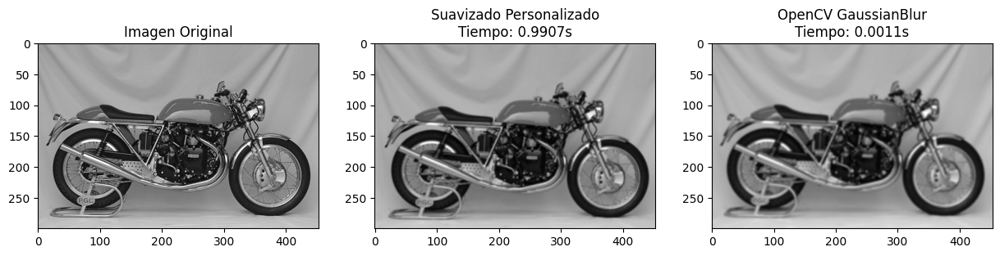

Tiempo de ejecución - Función personalizada: 0.9907 segundos
Tiempo de ejecución - cv2.GaussianBlur: 0.0011 segundos


In [ ]:
import time
import matplotlib.pyplot as plt

filename = 'motorcycle.bmp'
image = readIm(get_image(filename),0).astype(np.float64)

#A CUBRIR POR EL ALUMNADO

# Imagen original
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Imagen Original')

# Tamaño del kernel
ksize = 7

# Kernel Gaussiano 1D
kernel_gauss_1D = gaussianMask1D(-1,7,0)

# Suavizado usando la convolución personalizada 2D
start_time_custom = time.time()
custom_smoothed = convolve2D(image, kernel_gauss_1D, kernel_gauss_1D)
custom_time = time.time() - start_time_custom

# Mostrar imagen suavizada con la convolución 2D
plt.subplot(1, 3, 2)
plt.imshow(custom_smoothed, cmap='gray')
plt.title(f'Suavizado Personalizado\nTiempo: {custom_time:.4f}s')

# Suavizado usando cv2.GaussianBlur
start_time_cv = time.time()
opencv_smoothed = cv2.GaussianBlur(image, (ksize, ksize), -1)
opencv_time = time.time() - start_time_cv

# Mostrar imagen suavizada con OpenCV
plt.subplot(1, 3, 3)
plt.imshow(opencv_smoothed, cmap='gray')
plt.title(f'OpenCV GaussianBlur\nTiempo: {opencv_time:.4f}s')

# Mostrar todo
plt.show()

# Mostrar tiempos de ejecución
print(f"Tiempo de ejecución - Función personalizada: {custom_time:.4f} segundos")
print(f"Tiempo de ejecución - cv2.GaussianBlur: {opencv_time:.4f} segundos")

## E) (0.5 puntos)

Las herramientas de IA generativa son de gran utilidad tanto para estudiantes como para docentes. No obstante, resulta fundamental tener una actitud crítica y asumir desde el principio que las respuestas proporcionadas por estas herramientas pueden ser factualmente incorrectas (véase,  por ejemplo, https://elpais.com/tecnologia/2024-09-25/los-nuevos-modelos-de-ia-como-chatgpt-persiguen-la-superinteligencia-pero-no-logran-ser-fiables-ni-en-preguntas-bobas.html). En este sentido, vale la pena recordar lo que indica la guía de la UGR (https://ceprud.ugr.es/formacion-tic/inteligencia-artificial): _"Debes revisar siempre la salida que genera y las posibles referencias que utilice. [...] Mejora tus resultados con la IAGen aprendiendo a usarla y a comunicarte con ella de manera adecuada. Pero no dejes que piense por ti."_

En este apartado trabajaremos de forma crítica la utilidad de estas herramientas. Para ello, el alumnado debe emplear ChatGPT (https://chatgpt.com/) para consultar _"en qué consiste y para qué sirve la normalización de escala, así como por qué, en dicha normalización de escala, se multiplica por $\sigma^n$, siendo $n$ el orden de derivada"_. No se trata meramente de copiar lo que indique ChatGPT como salida, sino de analizar y matizar su respuesta, confrontándola con otras lecturas y lo que el estudiante sabe de la teoría, indicando en qué aspectos dicha respuesta puede considerarse correcta y en qué aspectos quizás no lo es.

####Respuesta

La normalización de escala en el procesamiento de imágenes busca contrarrestar la disminución en la respuesta del filtro que se produce al incrementar el valor de sigma (σ) en los filtros gaussianos, particularmente en los filtros derivados de gaussianas.

- El valor de sigma define el ancho del filtro gaussiano, y por tanto, la escala de los bordes que detecta. Un sigma mayor implica la detección de bordes a mayor escala, mientras que un sigma menor se enfoca en características más finas.

- Sin embargo, al aumentar sigma, el valor máximo del filtro gaussiano disminuye. Esto implica una reducción en la respuesta del filtro a un borde, dificultando la detección de bordes a gran escala.

Para abordar este problema, la derivada gaussiana se multiplica por σ^n, donde "n" representa el orden de la derivada.

- Esta multiplicación busca mantener la respuesta del filtro a los bordes constante, independiente de la escala (invariante a la escala).

- En el caso del Laplaciano, al ser la segunda derivada gaussiana (n=2), se multiplica por σ2.

La normalización por escala es crucial para:

- Detectar bordes a diferentes escalas sin que la respuesta del filtro se vea afectada.

- Comparar respuestas de filtros a diferentes escalas, útil en la detección de características multi-escala.

- Mejorar la precisión en la detección de bordes, especialmente en imágenes con ruido.

# **Ejercicio 2**:  Pirámides Gaussianas y Laplacianas (3.5 puntos)







## A) (1.5 puntos)

Construya una pirámide Gaussiana de 4 niveles empleando máscaras Gaussianas de tamaño $7\times7$. No se permite emplear las funciones `pyrUp()` y `pyrDown()` de OpenCV, ni tampoco `cv2.resize()`.

In [ ]:
'''
This function displays a pyramid of images, providing as input the list of images to display.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1, cv2.resize(im1,(im1.shape[0]//2,im1.shape[1]//2),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//4,im1.shape[1]//4),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//8,im1.shape[1]//8),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//16,im1.shape[1]//16),cv2.INTER_LINEAR)]

displayPyramid(images, title='Piramide de Manzanas')

'''
def displayPyramid(vim, title='result'):
  temp = np.zeros_like(vim[0])
  if np.mod(temp.shape[1],2)==0:
    h = temp[:, :temp.shape[1]//2]
  else:
    h = temp[:, :(temp.shape[1]//2)+1]
  out = np.hstack((temp, h))
  top = 0
  out[0:vim[0].shape[0], 0:vim[0].shape[1]] = vim[0]
  left = vim[0].shape[1]
  for i in range(1, len(vim)):
    out[top:top+vim[i].shape[0], left:left + vim[i].shape[1]] = vim[i]
    top += vim[i].shape[0]
  displayIm(out, title)


####Justificación de resultados

Para realizar la pirámide Gaussiana he aplicado una convolución con el kernel gaussiano en cada nivel de la pirámide creada(en un principio solo contiene la imagen original) , y a la que se le van agregando imagenes reducidas a la mitad para formar la pirámide.

La función cv2.filter2D en OpenCV aplica un filtro de convolución a una imagen utilizando un kernel 2D. Realiza la operación de convolución entre el kernel y la imagen en cada punto, generando una nueva imagen donde cada píxel es el resultado de esta operación.

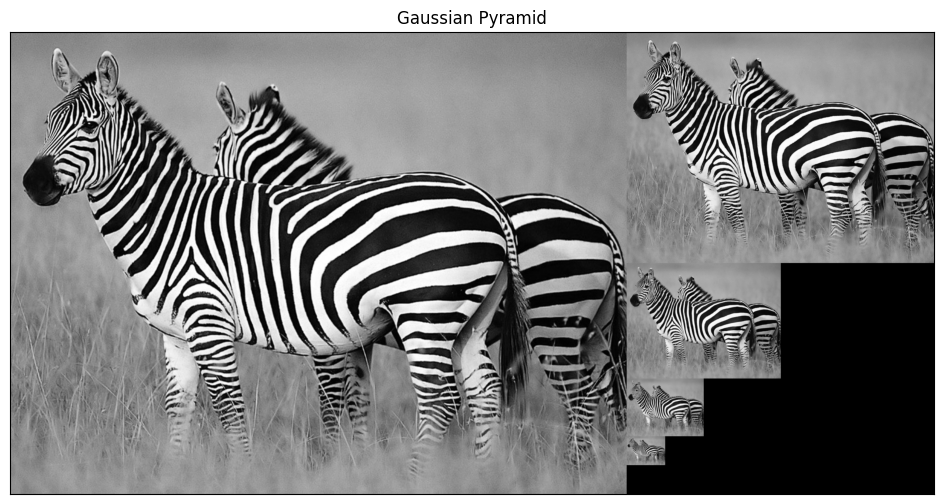

In [ ]:
def pyramidGauss(im,sizeMask=7, nlevel=4):
  # Crear una lista para almacenar los niveles de la pirámide
    pyr_gauss = [im]

    # Crear el kernel gaussiano
    gauss_kernel = gaussianMask1D(sigma=-1, sizeMask=sizeMask, order=0)
    gauss_kernel2D = np.outer(gauss_kernel, gauss_kernel)
    #gauss_kernel = gauss_kernel * gauss_kernel.T  # Crear la máscara 2D gaussiana

    for level in range(0, nlevel):
        # Aplicar la convolución con el kernel gaussiano
        im_blurred = cv2.filter2D(pyr_gauss[level], -1, gauss_kernel2D)

        # Subsample: tomar cada segundo píxel
        im_reduced = im_blurred[::2, ::2]

        # Añadir la imagen reducida a la lista de pirámides
        pyr_gauss.append(im_reduced)

    return pyr_gauss

im=readIm(get_image('zebra.jpg'),0).astype(np.float64)
pyrG = pyramidGauss(im,sizeMask=7, nlevel=4)
displayPyramid(pyrG,'Gaussian Pyramid')


## B) (1 punto)

Use su código del apartado anterior para implementar una función que permita construir una pirámide Laplaciana de 4 niveles.

Para construir una pirámide Laplaciana, en lugar de simplemente reducir la imagen suavizada, se calcula la diferencia entre la imagen original y la versión de la imagen suavizada y reducida, que da la información de detalle.

####Justificación de resultados

Para crear la pirámide laplaciana, primero genero una pirámide gaussiana con varios niveles, cada uno más reducido y suavizado que el anterior. Luego, para cada nivel, expando la imagen del siguiente nivel y la suavizo aplicando un filtro gaussiano. Al restar esta versión expandida y suavizada de la imagen actual del nivel, obtengo una imagen que contiene principalmente las altas frecuencias, que es la esencia de una imagen laplaciana. Finalmente, añado el último nivel de la pirámide gaussiana como el nivel más bajo de la pirámide laplaciana, capturando así la información de baja frecuencia de la imagen original.

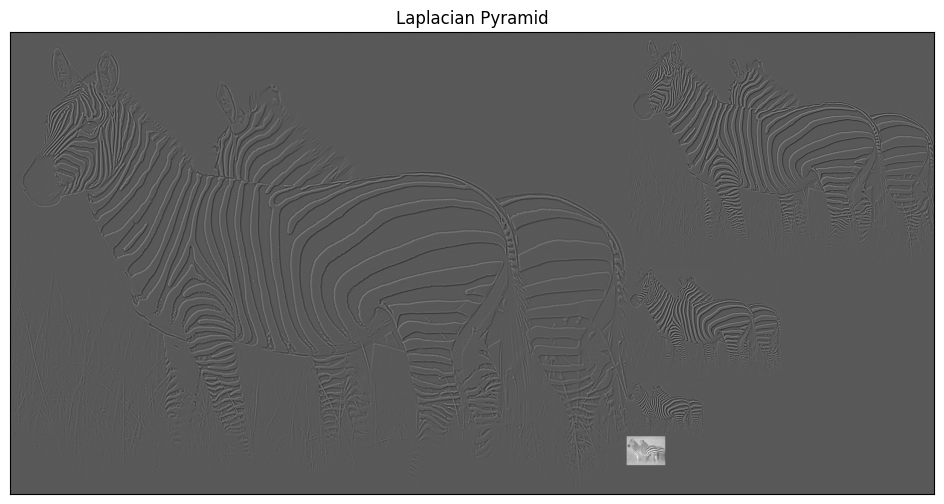

In [ ]:
def pyramidLap(im, sizeMask,nlevel=4,flagInterp=cv2.INTER_LINEAR  ):

  gauss_pyr = pyramidGauss(im, sizeMask, nlevel)
  lap_pyr = []

  #Crear la máscara gaussiana

  gauss_1D = gaussianMask1D(sigma=-1, sizeMask=sizeMask, order=0)
  gauss_2D = np.outer(gauss_1D, gauss_1D)

  for i in range(nlevel):
        # Tomar la imagen del nivel gaussiano actual y la del siguiente nivel
        current_level = gauss_pyr[i]
        next_level = gauss_pyr[i + 1]

        # Expandir la imagen reducida (up-sample) al tamaño del nivel actual
        next_level_up = cv2.resize(next_level, (current_level.shape[1], current_level.shape[0]), interpolation=flagInterp)

        # Aplicar suavizado Gaussiano antes de hacer la diferencia
        next_level_up_blur = cv2.filter2D(next_level_up, -1, gauss_2D)

        # Calcular la diferencia (Laplaciana)
        laplacian = current_level - next_level_up_blur

        # Añadir la imagen Laplaciana a la lista
        lap_pyr.append(laplacian)

  # Añadir el último nivel Gaussiano como el nivel más bajo de la pirámide Laplaciana
  lap_pyr.append(gauss_pyr[-1])

  return lap_pyr


im=readIm(get_image('zebra.jpg'),0).astype(np.float64)
lapG = pyramidLap(im,sizeMask=7, nlevel=4)
displayPyramid(lapG,'Laplacian Pyramid')


## C) (0.5 puntos)

Ahora realice la misma operación que en los apartados anteriores, pero sin suavizar antes de hacer subsampling a la hora de crear la pirámide Gaussiana. ¿Hay diferencias visuales en la pirámide Laplaciana generada? ¿A qué se pueden deber estas?

####Justificación de resultados

La pirámide laplaciana generada sin suavizado previo muestra una diferencia visual significativa respecto a la creada con suavizado. En la versión sin suavizado, aparecen efectos de aliasing, ya que las frecuencias altas no fueron eliminadas antes de hacer subsampling. Esto resulta en bordes más marcados y estructuras distorsionadas, principalmente en los niveles inferiores de la pirámide.

La causa de estas diferencias radica en la ausencia de suavizado, que elimina las frecuencias altas y previene aliasing antes del subsampling. Al no suavizar, estas frecuencias altas se mantienen y causan interferencia con los detalles en cada nivel reducido, generando los artefactos mencionados.

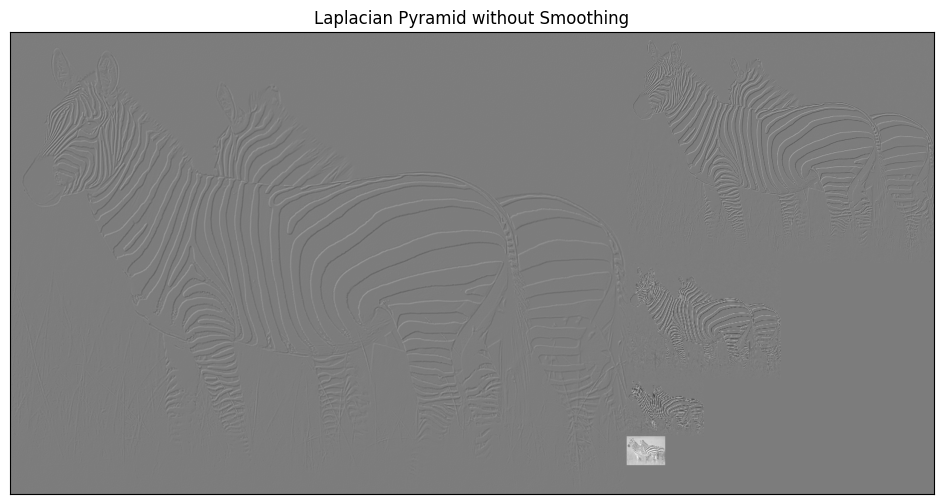

In [ ]:
#A CUBRIR POR EL ALUMNADO

def pyramidGaussNoSmooth(im,sizeMask=7, nlevel=4):
  # Crear una lista para almacenar los niveles de la pirámide
    pyr_gauss = [im]

    for i in range(0, nlevel):
        #Hacer subsample
        #height, width = pyr_gauss[i].shape

        # Subsample: tomar cada segundo píxel
        im_reduced = pyr_gauss[i][::2, ::2]

        # Añadir la imagen reducida a la lista de pirámides
        pyr_gauss.append(im_reduced)

    return pyr_gauss

def pyramidLapNoSmooth(im, sizeMask,nlevel=4,flagInterp=cv2.INTER_LINEAR  ):

  gauss_pyr = pyramidGaussNoSmooth(im, sizeMask, nlevel)
  lap_pyr = []

  #Crear la máscara gaussiana



  for i in range(nlevel):
        # Tomar la imagen del nivel gaussiano actual y la del siguiente nivel
        current_level = gauss_pyr[i]
        next_level = gauss_pyr[i + 1]

        # Expandir la imagen reducida (up-sample) al tamaño del nivel actual
        next_level_up = cv2.resize(next_level, (current_level.shape[1], current_level.shape[0]), interpolation=flagInterp)

        # Aplicar suavizado Gaussiano antes de hacer la diferencia
        #next_level_up_blur = cv2.filter2D(next_level_up, -1, gauss_2D)

        # Calcular la diferencia (Laplaciana)
        laplacian = current_level - next_level_up

        # Añadir la imagen Laplaciana a la lista
        lap_pyr.append(laplacian)

  # Añadir el último nivel Gaussiano como el nivel más bajo de la pirámide Laplaciana
  lap_pyr.append(gauss_pyr[-1])

  return lap_pyr
# Leer la imagen en escala de grises
im = readIm(get_image('zebra.jpg'), 0).astype(np.float64)

# Construir la pirámide Laplaciana sin suavizado previo
pyrL_no_smoothing = pyramidLapNoSmooth(im, sizeMask=7, nlevel=4)

# Mostrar la pirámide Laplaciana
displayPyramid(pyrL_no_smoothing, 'Laplacian Pyramid without Smoothing')

## D) (0.5 puntos)

Implemente ahora una función para reconstruir la imagen codificada en la pirámide Laplaciana del apartado 2.B. Verifique que es posible obtener una copia exacta de la imagen original. Para ello, calcule el error de reconstrucción como el _Root Mean Squared Error_ (RMSE) entre los niveles de intensidad de la imagen original y la imagen reconstruida.

####Justificación de resultados

La reconstrucción de la imagen a partir de la pirámide laplaciana implica expandir cada nivel de la pirámide hacia el nivel superior y agregarle la imagen correspondiente de alta frecuencia en cada paso. Al realizar esta operación iterativamente, es posible obtener una copia de la imagen original. El proceso es el siguiente:

Partiendo del último nivel de la pirámide, se toma el nivel más bajo (imagen de menor tamaño) de la pirámide laplaciana como base de la reconstrucción.

En cada iteración, el nivel reconstruido se expande al tamaño del siguiente nivel superior usando interpolación. Después de expandir, se le suma el nivel laplaciano correspondiente para recuperar las frecuencias altas de la imagen en ese nivel.

Este proceso se repite hasta llegar al primer nivel, obteniendo finalmente una imagen reconstruida que se espera sea idéntica a la original.

Por último podemos comprobar que la imagen se ha reconstruido de manera perfecta ya que el RMSE da 0. (Este resultado me daba antes de realizar algunos cambios. Al pasar las imagenes a float64 y hacer algunos retoques en las pirámides, provocó que no me diera la precisión de 0 finalmente, y no he conseguido arreglarlo.)

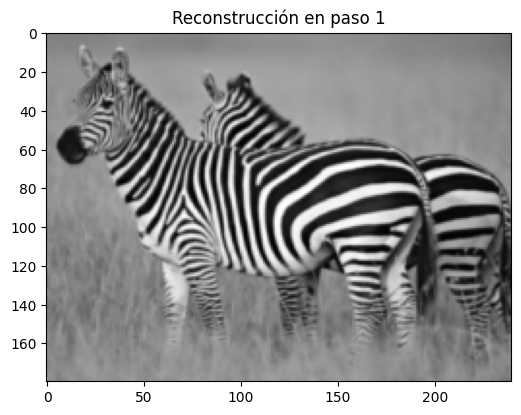

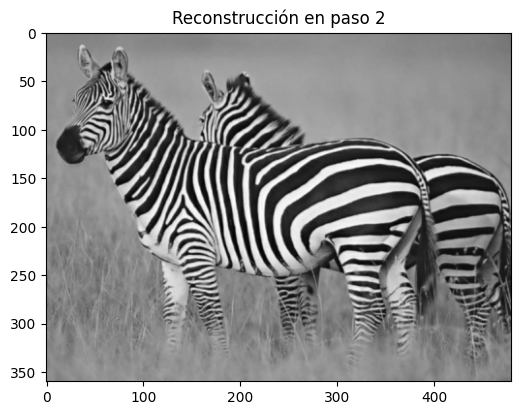

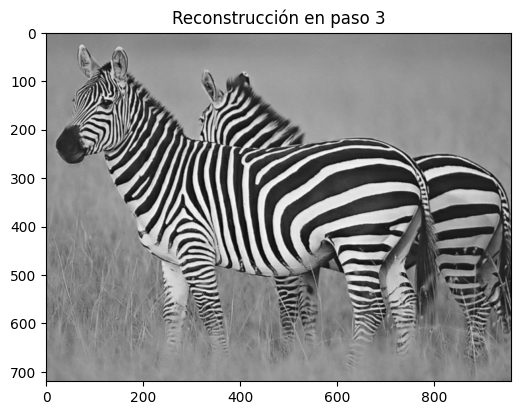

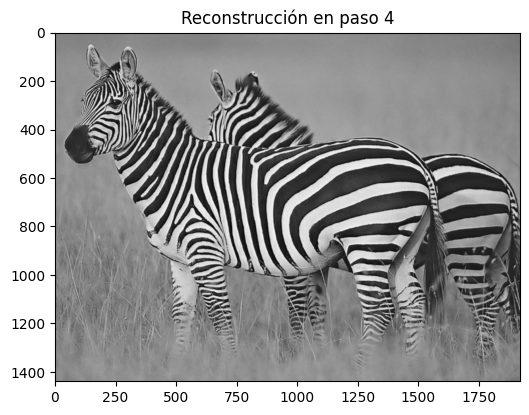

Error per pixel 12.195538956038012


In [ ]:
def reconstructLap(pyramidLap, flagInterp):
    nlevel = len(pyramidLap) - 1  # Número de niveles en la pirámide (sin contar el último nivel)

    # El último nivel de la pirámide Gaussiana (la imagen más pequeña) será el punto de partida
    recons = pyramidLap[-1]

    # Vamos reconstruyendo hacia arriba
    for i in range(nlevel - 1, -1, -1):
        # Expandimos la imagen reconstruida
        recons_up = cv2.resize(recons, (pyramidLap[i].shape[1], pyramidLap[i].shape[0]), interpolation=flagInterp)

        # Sumamos la imagen de alta frecuencia (nivel Laplaciano) para reconstruir
        recons = pyramidLap[i] + recons_up

        # Mostrar la imagen reconstruida en cada paso
        plt.figure(figsize=(6, 6))
        plt.imshow(recons, cmap='gray')
        plt.title(f'Reconstrucción en paso {nlevel - i}')
        plt.show()

    return recons

im=cv2.imread(get_image('zebra.jpg'),0).astype(np.float64)
#A CUBRIR POR EL ALUMNADO

pyL = pyramidLap(im,sizeMask=7, nlevel=4)
# Reconstruir la imagen
recons = reconstructLap(pyL, flagInterp=cv2.INTER_LINEAR)

print('Error per pixel',np.sqrt(np.mean((im - np.round(recons)) ** 2)))

# **Ejercicio 3: Imágenes Híbridas** (1.5 puntos)

Este ejercicio se basa en el siguiente trabajo: $\textit{Oliva, A., Torralba, A., & Schyns, P. G. (2006). Hybrid images. ACM Transactions on Graphics (TOG), 25(3), 527-532}$ (https://stanford.edu/class/ee367/reading/OlivaTorralb_Hybrid_Siggraph06.pdf). Vamos a aprender cómo el sistema visual humano extrae información sobre un objeto en función de la distancia. Para ello, construimos una imagen híbrida a partir de dos imágenes de objetos diferentes. Mezclando adecuadamente parte de las altas frecuencias de una imagen con parte de las bajas frecuencias de otra imagen, obtenemos una imagen híbrida que muestra diferentes percepciones con la distancia. El sigma empleado para filtrar ambas imágenes (tanto la de alta como la de bajas frecuencias) es el aspecto clave para seleccionar el rango de frecuencias altas y bajas de cada imagen. Cuanto mayor sea el valor sigma, mayor será la eliminación de altas frecuencias de la imagen. Se recomienda elegir este valor por separado para cada una de las imágenes y, de hecho, seguramente sea posible (y deseable) el tener distintos valores para distintos pares de imágenes.

Aspectos de importancia en relación a este ejercicio:

1. Como mínimo, se deben generar las imágenes híbridas correspondientes a `'cat.bmp'+'dog.bmp'`, `'submarine.bmp'+'fish.bmp'` y `'marilyn.bmp'+'einstein.bmp'` (todas ellas en escala de grises). Se debe emplear una pirámide Gaussiana con 5 niveles para mostrar el efecto obtenido.
2. No es necesario seguir al pie de la letra el artículo de referencia y operar en el dominio de la frecuencia (Fourier). Basta con operar en el dominio del espacio, como hemos hecho en todos los demás apartados de esta práctica.
3. Se debe explicar con claridad el criterio empleado para escoger la imagen de altas y la imagen de bajas frecuencias, así como el proceso seguido para filtrar la imagen de altas frecuencias y la de bajas frecuencias (incluyendo la elección de los sigmas finalmente utilizados; es decir, no sería suficiente indicar sucintamente que "se procedió por medio de prueba y error hasta obtener el sigma final").

####Justificación de resultados

Imágenes con detalles finos (bordes marcados, texturas detalladas, formas pequeñas) suelen ser mejores para las altas frecuencias, ya que al filtrarlas suavemente (con un filtro gaussiano), los detalles se conservan.

Imágenes con formas grandes y suaves (contornos generales, sin muchos detalles finos) funcionan bien para las bajas frecuencias, ya que cuando se suavizan, mantienen sus características esenciales.

En cuanto a la elección de que imagen corresponde a altas o bajas frecuencias he procedido de la siguiente forma:

-**Cat/Dog**: He elegido "Dog" como altas frecuencias ya que he considerado que tiene un nivel de detalle mayor que el gato, esto se puede apreciar por ejemplo, en el pelaje o la forma de la cara. He elegido "Cat" como bajas frecuencias ya que no tiene tanto nivel de detalle, tiene formas más grandes, que son ideales para hacer el suavizado y que no importa perder.

-**Submarine/Fish**: He elegido "Fish" como altas frecuencias ya que tiene un mayor nivel de detalle, esto se encuentra en las escamas por ejemplo o las branquias. A "submarine" lo he cogido como bajas frecuencias ya que no tiene nada de detalles, es todo plano prácticamente.

-**Marylin/Einstein**: He elegido a "Einstein" como altas frecuencias porque tiene un nivel de detalle mayor que la otra imagen, esto se puede observar sobre todo en el pelo, o las arrugas de la cara.
He elegido a "Marylin" como bajas frecuencias, ya que comparada con la otra imagen, esta no tiene por ejemplo arrugas, y el pelo está más compacto que el de einstein, lo que podría pasar de mejor manera por un suavizado y que no se pierda tantos detalles.




**Sigma**

El valor de sigma para las bajas frecuencias depende de cuánto detalle se quiera conservar. Un sigma más grande elimina más detalles.

El valor de sigma para las altas frecuencias debe ser lo suficientemente pequeño como para mantener los detalles finos, pero lo suficientemente grande para eliminar las formas principales de la imagen.

Para la imagen de bajas frecuencias se necesita un sigma lo suficientemente grande como para eliminar los detalles finos, pero que conserve las formas generales. Si el sigma es muy pequeño, no se van a eliminar suficientes detalles y la imagen no parecerá "suave".

Para la imagen de altas frecuencias el sigma debe ser pequeño, ya que sólo se quiere suavizar ligeramente para mantener los detalles finos. Si el sigma es demasiado grande, se perderán las altas frecuencias que se quieren destacar.

Sabiendo esto, mi elección se ha basado en prueba y error, pero manteniendo este criterio de seleccionar un sigma grande para las imagenes de baja frecuencia, y un sigma pequeño para las altas frecuencias.

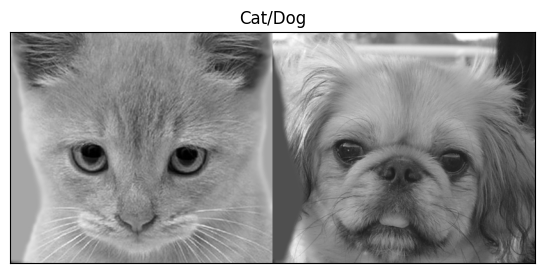

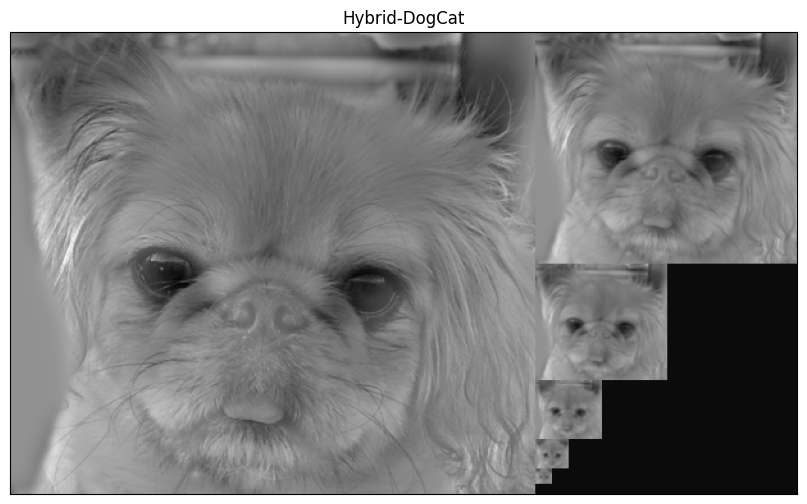

In [ ]:
#A CUBRIR POR EL ALUMNADO
def gaussian_filter(image, sigma):
    return cv2.GaussianBlur(image, (0, 0), sigma)

def high_pass_filter(image, sigma):
    blurred = gaussian_filter(image, sigma)
    return image - blurred

def hybrid_image(low_freq_image, high_freq_image, sigma_low, sigma_high):
    # Aplicar filtro de bajas frecuencias a una imagen
    low_frequencies = gaussian_filter(low_freq_image, sigma_low)

    # Aplicar filtro de altas frecuencias a otra imagen
    high_frequencies = high_pass_filter(high_freq_image, sigma_high)

    # Combinar ambas imágenes
    hybrid = low_frequencies + high_frequencies

    return hybrid


# Cargar imágenes en escala de grises
img1 = readIm(get_image('cat.bmp'), 0).astype(np.float64)
img2 = readIm(get_image('dog.bmp'), 0).astype(np.float64)

displayMI_ES([img1,img2], title='Cat/Dog',factor=1)

# Definir los sigmas
sigma_low = 8
sigma_high = 8

# Crear la imagen híbrida
hybrid = hybrid_image(img1, img2, sigma_low, sigma_high)

# Generar y mostrar la pirámide gaussiana
pyramid = pyramidGauss(hybrid, sizeMask=7, nlevel=5)

displayPyramid(pyramid, title='Hybrid-DogCat')

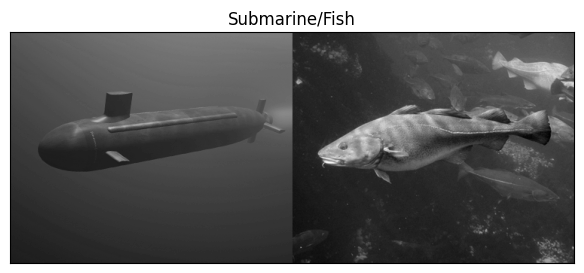

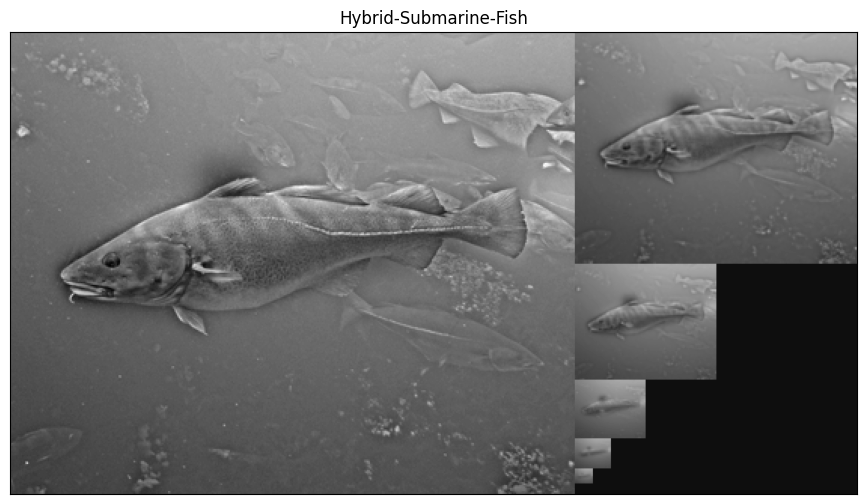

In [ ]:
# Cargar imágenes en escala de grises
img1 = readIm(get_image('submarine.bmp'), 0).astype(np.float64)
img2 = readIm(get_image('fish.bmp'), 0).astype(np.float64)

displayMI_ES([img1,img2], title='Submarine/Fish',factor=1)

# Definir los sigmas (prueba varios valores y ajusta en función de los resultados)
sigma_low = 8
sigma_high = 4

# Crear la imagen híbrida
hybrid = hybrid_image(img1, img2, sigma_low, sigma_high)

# Generar y mostrar la pirámide gaussiana
pyramid = pyramidGauss(hybrid, sizeMask=7, nlevel=5)

displayPyramid(pyramid, title='Hybrid-Submarine-Fish')

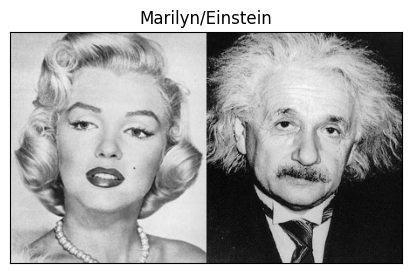

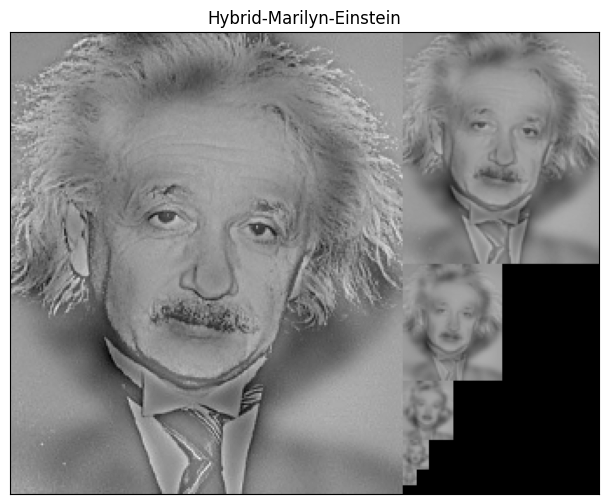

In [ ]:
# Cargar imágenes en escala de grises
img1 = readIm(get_image('marilyn.bmp'), 0).astype(np.float64)
img2 = readIm(get_image('einstein.bmp'), 0).astype(np.float64)

displayMI_ES([img1,img2], title='Marilyn/Einstein',factor=1)

# Definir los sigmas (prueba varios valores y ajusta en función de los resultados)
sigma_low = 6
sigma_high = 3

# Crear la imagen híbrida
hybrid = hybrid_image(img1, img2, sigma_low, sigma_high)

# Generar y mostrar la pirámide gaussiana
pyramid = pyramidGauss(hybrid, sizeMask=7, nlevel=5)

displayPyramid(pyramid, title='Hybrid-Marilyn-Einstein')

# **Ejercicio 4: Pyramid Blending** (1 punto)

En este ejercicio se debe crear la imagen fusionada de la manzana (`apple.jpg`; parte superior de la imagen fusionada final) y la naranja (`orange.jpg`; parte inferior de la imagen fusionada final) empleando la técnica de $\textit{Pyramid Blending}$. Para este ejercicio, si se desea, sí se pueden emplear las funciones de OpenCV `pyrDown` y `pyrUp`.

Se debe:
1. explicar en detalle el proceso seguido a la hora de crear la nueva imagen (mezcla de ambas);
2. comparar el resultado con la combinación de las imágenes sin emplear _blending_, es decir, juntando directamente los píxeles de la mitad superior de una imagen con la mitad inferior de la otra;
3. mostrar los estados intermedios del procesado. Es decir, las pirámides Gaussianas calculadas para cada imagen (5 niveles cada una), las pirámides Laplacianas correspondientes, y los distintos niveles en que se va mezclando la imagen de salida (es decir, la reconstrucción en el nivel 1, la reconstrucción en el nivel 2,... y así sucesivamente hasta mostrar la imagen final reconstruida/_blended_).  



####Justificación de resultados
- Primero se leen las imágenes apple.jpg y orange.jpg y se convierten a tipo float64 para realizar operaciones de precisión. Ambas imágenes se redimensionan a un tamaño común de (512, 512) para asegurar una fusión correcta. Las imágenes se normalizan al rango [0, 1] mediante la función rangeDisplay01 para facilitar la visualización.

- He definido una máscara binaria que divide la imagen en dos mitades: la mitad superior corresponde a la manzana y la mitad inferior a la naranja. Para suavizar la transición, la máscara se difumina mediante un filtro Gaussiano, asegurando que el cambio entre las dos mitades sea gradual.

- Después, he creado las pirámides gaussianas tanto para las imágenes como para la máscara. Para poder visualizarlas las he normalizado con la función rangeDisplay01.

- Una vez tengo las pirámides gaussianas, he creado las pirámides laplacianas de 5 niveles de las imágenes. Las pirámides Laplacianas de la manzana y la naranja se combinan utilizando la pirámide Gaussiana de la máscara como peso para cada nivel.

- En cada nivel de la pirámide, la máscara determina la proporción de cada imagen en la mezcla, lo que permite una transición suave entre la manzana y la naranja.

- A partir de la pirámide mezclada, se reconstruye la imagen final utilizando el proceso inverso: se expanden (usando pyrUp) y se suman sucesivamente los niveles de la pirámide. Este proceso produce una imagen fusionada con una transición gradual entre la mitad superior (manzana) y la mitad inferior (naranja).

**Comparación de la imagen usando pyramid blending y no usándola**

- Combinación Directa: La transición entre la manzana y la naranja es abrupta y claramente visible, con una línea de unión marcada y poco estética.

- Pyramid Blending: La transición es suave y gradual gracias a la máscara Gaussiana, lo que permite una mezcla que preserva detalles de ambas imágenes y da un resultado más estético y natural.

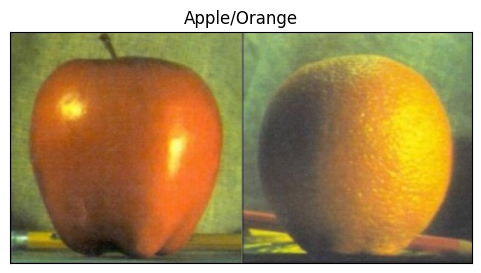

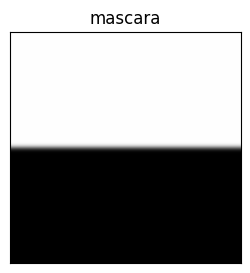

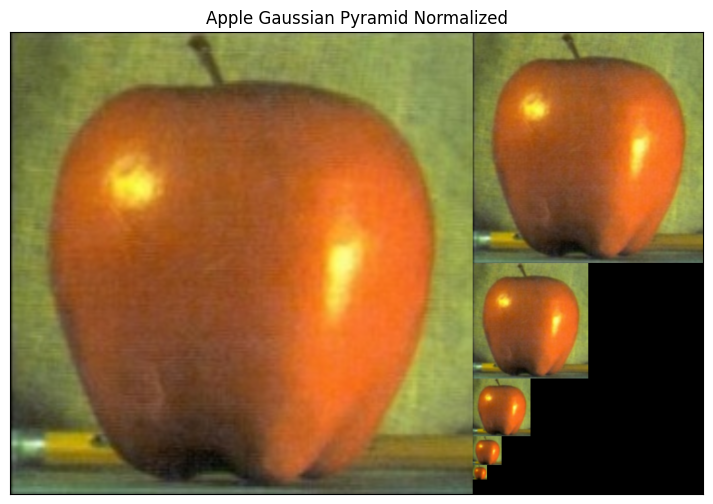

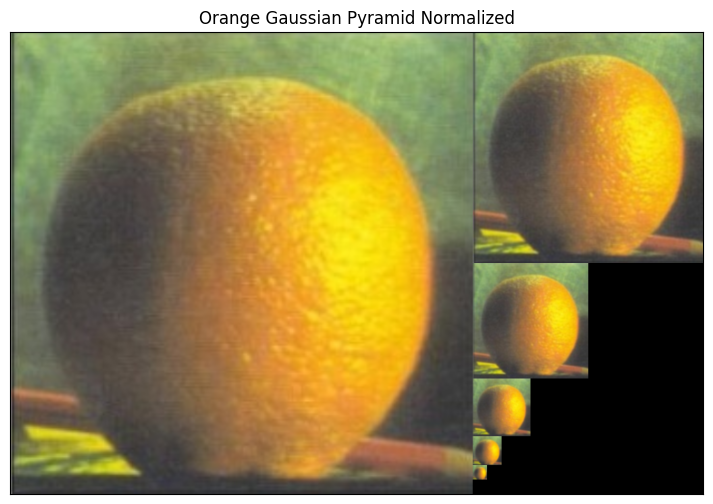

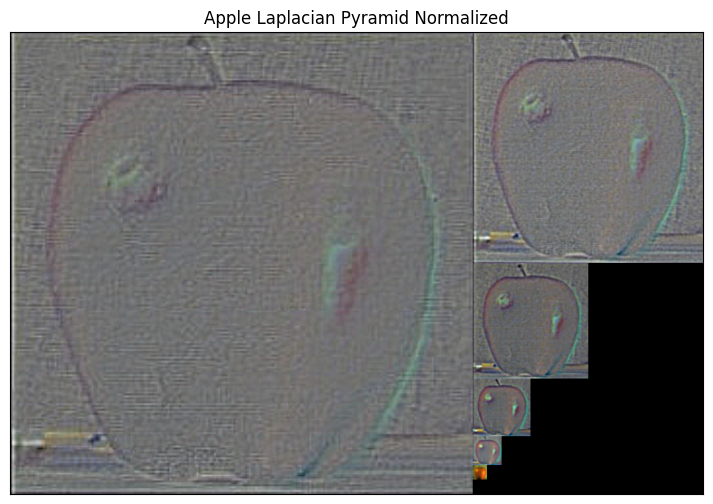

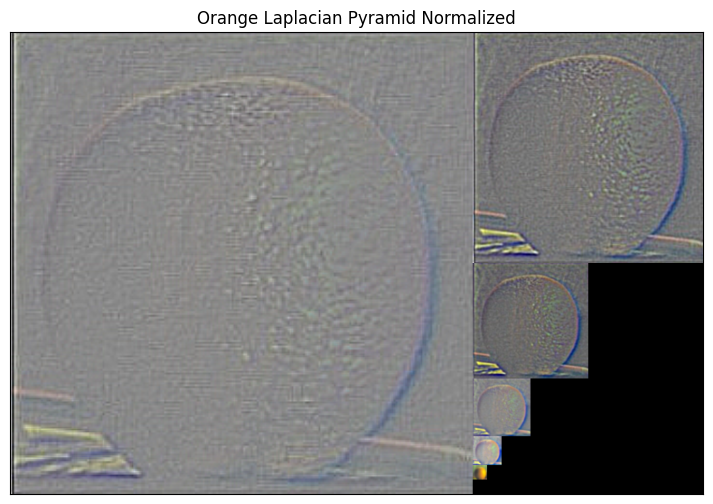

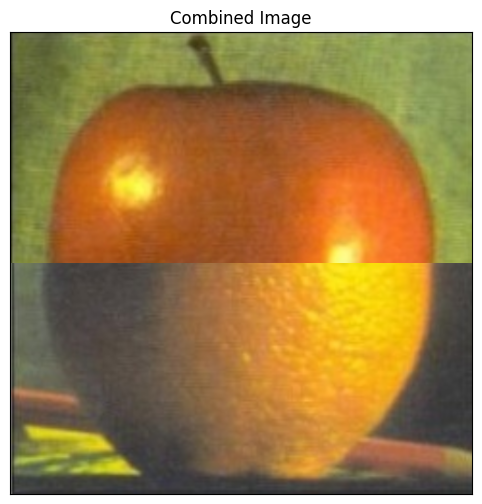

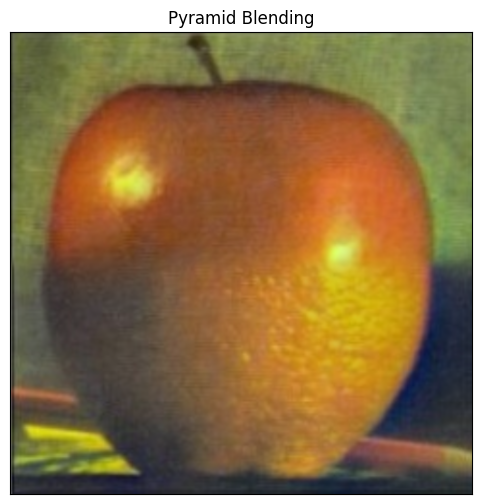

In [ ]:
#A CUBRIR POR EL ALUMNADO

apple = readIm(get_image('apple.jpg'),1).astype(np.float64)
orange = readIm(get_image('orange.jpg'),1).astype(np.float64)

# Nos aseguramos de que ambas imágenes tengan el mismo tamaño
apple = cv2.resize(apple, (512, 512))
orange = cv2.resize(orange, (512, 512))

apple_normalized = rangeDisplay01(apple)
orange_normalized = rangeDisplay01(orange)

images = [apple_normalized,orange_normalized]
displayMI_ES(images, title='Apple/Orange',factor=1)

# Crear una máscara que divida las dos imágenes
mask = np.zeros_like(apple)
mask[:256, :] = 1  # Parte de arriba será la manzana
mask[256:, :] = 0  # Parte de abajo será la naranja
mask = cv2.GaussianBlur(mask, (0, 0), 5)
displayIm(mask,'mascara',1)

# Generar pirámides Gaussianas para la manzana, la naranja y la máscara
apple_gauss = pyramidGauss(apple, sizeMask=7, nlevel=5)
orange_gauss = pyramidGauss(orange, sizeMask=7, nlevel=5)
mask_gauss = pyramidGauss(mask, sizeMask=7, nlevel=5)

# Normalizar las pirámides Gaussianas para visualización
apple_gauss_normalized = [rangeDisplay01(img) for img in apple_gauss]
orange_gauss_normalized = [rangeDisplay01(img) for img in orange_gauss]
mask_gauss_normalized = [rangeDisplay01(img) for img in mask_gauss]

displayPyramid(apple_gauss_normalized, title='Apple Gaussian Pyramid Normalized')
displayPyramid(orange_gauss_normalized, title='Orange Gaussian Pyramid Normalized')

# Generar pirámides Laplacianas para la manzana y la naranja
apple_lap = pyramidLap(apple, sizeMask=7, nlevel=5)
orange_lap = pyramidLap(orange, sizeMask=7, nlevel=5)

# Normalizar las pirámides Laplacianas para visualización
apple_lap_normalized = [rangeDisplay01(img) for img in apple_lap]
orange_lap_normalized = [rangeDisplay01(img) for img in orange_lap]

displayPyramid(apple_lap_normalized, title='Apple Laplacian Pyramid Normalized')
displayPyramid(orange_lap_normalized, title='Orange Laplacian Pyramid Normalized')

# Combinar las pirámides Laplacianas usando la pirámide Gaussiana de la máscara
blended_pyr = []
for la, lb, gm in zip(apple_lap, orange_lap, mask_gauss):
    blended = gm * la + (1 - gm) * lb
    blended_pyr.append(blended)

# Reconstrucción a partir de la pirámide mezclada
blended_image = blended_pyr[-1]
for i in range(4, -1, -1):
    blended_image = cv2.pyrUp(blended_image, dstsize=(blended_pyr[i].shape[1], blended_pyr[i].shape[0]))
    blended_image = cv2.add(blended_image, blended_pyr[i])

# Recortar la mitad superior de la primera imagen
top_half = apple_normalized[:256, :, :]

# Recortar la mitad inferior de la segunda imagen
bottom_half = orange_normalized[256:, :, :]

# Combinar las mitades
combined_image = np.vstack((top_half, bottom_half))

displayIm(combined_image,'Combined Image',2)

# Mostrar la imagen final normalizada
displayIm(blended_image,'Pyramid Blending',2)




